<a href="https://colab.research.google.com/github/simoncamal/tutorial-forecasting-trading/blob/main/tutoriel_v2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tutoriel prévision de production renouvelable et prise de décision dans les marchés de l'électricité
## Auteur: Simon Camal, MINES Paris - PSL University, Research Center PERSEE
## Licence: Creative Commons 4.0  

**Objectifs de ce tutoriel**

Ce tutoriel propose une introduction aux méthodes de prévision de production renouvelable à court-terme (horizons prochaines heures aux prochains jours).

Ce que vous apprendrez:

1.   Les enjeux et principes de base de la prévision à l'aide de méthodes statistiques, appliquée ici au contexte des énergies renouvelables. Ces méthodes peuvent s'appliquer à de nombreux domaines.
2.   Analyser la sensibilité des méthodes de prévision à leurs paramètres et les voies d'amélioration possibles.
3.   Appliquer la prévision de production renouvelable à un problème simple de vente d'énergie sur les marchés de l'électricité.



Démarrage: à chaque nouvelle session d'accès à ce notebook, veuillez executer la commande ci-dessous afin d'installer les packages nécessaires.

In [ ]:

# Packages pour la prévision
!pip install shap

!pip install properscoring

# Packages pour l'optimisation

!pip install pyomo

!apt-get install -y -qq glpk-utils

!wget -N -q "https://ampl.com/dl/open/ipopt/ipopt-linux64.zip"
!unzip -o -q ipopt-linux64

Import des librairies nécessaires

In [ ]:
import os
import plotly.express as px
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import ExtraTreesRegressor, GradientBoostingRegressor

from statsmodels.distributions.empirical_distribution import ECDF
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import pacf

from scipy.interpolate import interp1d
from scipy.stats import norm

import shap

import pyomo.environ as pyo

import random
random.seed(10)

Fonctions d'évaluation des performances de prévision



In [ ]:
# Root Mean Squared Error
def RMSE(y_pred, y):
  return np.sqrt(np.mean((y-y_pred)**2))

def MAE(y_pred, y):
  return np.mean(np.abs(y-y_pred))

import warnings
import properscoring as ps
def CRPS(ens,obs):

    if type(obs) is pd.Series:
        obs = obs.to_numpy()
    if type(ens) is pd.DataFrame:
        ens = ens.to_numpy()
    obs = np.reshape(obs, (len(obs),1))
    idx = np.c_[obs,ens]
    idx = ~np.isnan(idx).any(axis=1) # check rows with NaNs
    ens = ens[idx,:] # remove rows with NaNs
    obs = obs[idx]
    ens.sort(axis=1) # Make sure there's no quantile crossing

    lst = []
    for k in range(ens.shape[0]):
        lst.append(ps.crps_ensemble(obs[k,0], ens[k]))
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=RuntimeWarning)
        return lst,np.nanmean(lst)


Entre votre index de groupe pour le tutoriel entre 1 et 6


In [ ]:
group_index = 3

# 1. Prévision de production renouvelable

Ce tutoriel se base sur les données de la compétition internationale de prévision GEFCOM2014 ([lien vers l'article](http://dx.doi.org/10.1016/j.ijforecast.2016.02.001)). Ces données sont en libre accès, elles correspondent à des séries de production de sites renouvelables photovoltaïque (PV) et éolien anonymisées ainsi que les prix du marché de l'électricité court-terme sur la même période.

Pour ce tutoriel, les données des sites renouvelables ont été préparées et divisées en 6 sets de données, 1 set par centrale de production renouvelable:

* Groupe 1: Centrale solaire PV 1
* Groupe 2: Centrale solaire PV 2
* Groupe 3: Centrale solaire PV 3
* Groupe 4: Centrale éolienne 1
* Groupe 5: Centrale éolienne 2
* Groupe 6: Centrale éolienne 3

La production de puissance est normalisée par la puissance installée. Les caractéristiques techniques des centrales (dimension du rotor et hauteur du mât de l'éolienne, technologie et orientations des modules PV, etc.) ne sont pas disponibles, on doit donc recourir à des approches purement statistiques.

Les données de production sont accompagnées de variables potentiellement explicatives qui pourront servir d'entrées aux modèles de prévision.

Les variables explicatives pour les centrales solaires sont présentées dans la Table ci-dessous. La variable SSRD correspond à l'irradation reçue sur un plan horizontal.

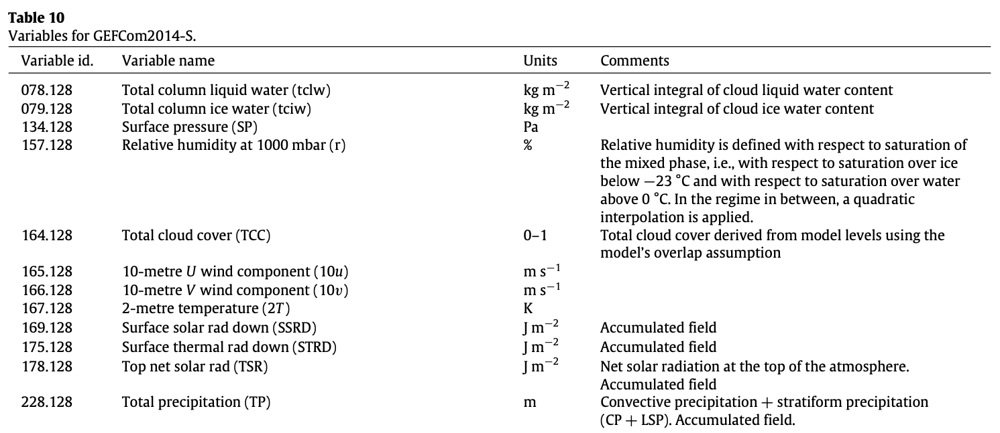

Les variables explicatives pour les centrales éoliennes sont:
* Vitesse de vent à 10 m et 100 m du sol, en m/s
* Direction du vent à 10 m et 100m du sol, en ° (0° = N)
* Vitesses de vent U,V zonales et méridionales



---


## 1.1. Import des données de production et variables explicatives

Le code ci-dessous importe les données et montre la série temporelle de production.

Il présente l'autocorrélation (ACF) ainsi que l'autocorrélation partielle (PACF)du signal de production. L'autocorrélation partielle PACF évalue la corrélation entre le signal aux instants $t$ et $t-l,  l > 0$, en retirant l'influence des retards intermédiaires. Le retard $p$ tel que $PACF(y_{l'}) \sim 0, \quad \forall l' \geq p$ est un bon indicateur de l'ordre $p$ d'un modèle auto-régressif $\hat{y} \sim AR(p), \hat{y}_t = y_{0} + y_{t-1} + ... + y_{t-p} \quad \forall t$.

Quelle est votre intreprétation de l'autocorrélation et de l'autocorrélation partielle?

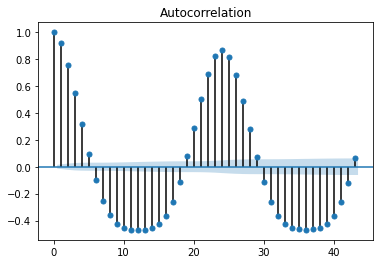

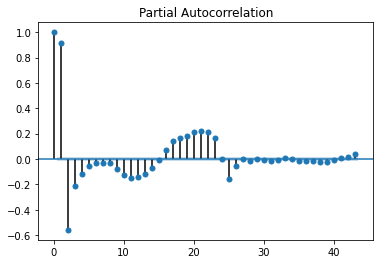

In [ ]:
# Import des données

#data_site = pd.read_csv('tutorial_data/data_group1.csv', parse_dates=True, index_col=0)

data_site = pd.read_csv('https://raw.githubusercontent.com/simoncamal/tutorial-forecasting-trading/main/tutorial_data/data_group' + str(group_index) + '.csv',
                        parse_dates=True, index_col=0)

# Visualisation de la série temporelle de production
px.line(data_site.reset_index(), x='TIMESTAMP', y='POWER').show()

# Visualisation de l'autocorrélation et de l'autocorrélation partielle

y = data_site.POWER # this is the response variable
plot_acf(y)
plot_pacf(y)
pacf_site = pacf(y)



---

**Exercice 1 (30 min)**:

Implémenter une régression linéaire pour effectuer une prévision de production à horizon de 1 h.

Cette prévision s'effectue à partir des retards $y_{t-l}$ appliqués sur l'observation $y_t$.

Liste des tâches:
1. Trouver la combinaison de retards donnant le meilleur coefficient de détermination $R^2$ entre prévisions et observations sur l'ensemble de test.
2. Répéter le modèle avec des horizons allant jusqu'à 6 h et tracer l'évolution du $R^2$ en fonction de l'horizon, et en option en fonction du nombre de retards.
3. Discuter de solutions possibles pour améliorer votre modèle, en vous comparant au modèle naïf dit de persistence
4. Présenter vos résultats aux autres groupes.     

---






On applique ici une stationarisation simple dépendant du type de source d'énergie

In [ ]:
if group_index <= 3:
  # Energy Source == PV

  # For PV, rows with nightly values are deleted (top solar radiation = 0)
  data_site = data_site[data_site.TSR > 0]

  # Then we divide POWER and SSRD by the irradiance trend given by the TSR.
  # The TSR is normalized by the max irradiance on top of atmosphere, 1361 W/m2
  data_site_stationarized = data_site.assign(TSR_normalized = lambda x: x['TSR']/1361,
                                 POWER_Transformed= lambda x: x['POWER']/x['TSR_normalized'],
                                 SSRD_by_TSR= lambda x: x['SSRD']/x['TSR'])
  data_site_stationarized.loc[np.isnan(data_site_stationarized['POWER_Transformed']),'POWER_Transformed'] = 0
  data_site_stationarized.loc[np.isinf(data_site_stationarized['POWER_Transformed']),'POWER_Transformed'] = 0
  data_site_stationarized.loc[np.isnan(data_site_stationarized['SSRD_by_TSR']),'SSRD_by_TSR'] = 0
  data_site_stationarized.loc[np.isinf(data_site_stationarized['SSRD_by_TSR']),'SSRD_by_TSR'] = 0

  # limit the stationarized PV POWER and SSRD to 2 the normalized TSR (creates a small error that we assume small here)
  data_site_stationarized.loc[data_site_stationarized['POWER_Transformed'] > 2,'POWER_Transformed'] = 2
  data_site_stationarized.loc[data_site_stationarized['SSRD_by_TSR'] > 2,'SSRD_by_TSR'] = 2

  # Analysis of the distribution of values
  # print(data_site_stationarized[['TSR','POWER', 'POWER_Transformed']].describe())
  px.line(data_site_stationarized[['TSR_normalized', 'POWER_Transformed', 'SSRD_by_TSR']].reset_index().melt(id_vars='TIMESTAMP'), x='TIMESTAMP', y='value', color='variable').show()
else:
  # Energy Source == Wind

  # For Wind, we transform the response from [0,1] domain to real values, better suited for linear regression
  data_site.loc[data_site.POWER == 0, 'POWER'] = 0.01 # Non zero values in order to transform by logit to finite real value
  data_site.loc[data_site.POWER == 1, 'POWER'] = 0.99
  data_site_stationarized = data_site.assign(POWER_Transformed = lambda x: np.log(x['POWER']/(1-x['POWER'])))


On configure ici notre prévision intraday:

*   horizon de prévision `prediction_horizon`, en heures
*   nombre de retards `number_lags`

In [ ]:
prediction_horizon = 1
number_lags = 15

On ajoute maintenant les retards à la production, en fonction de l'horizon de prévision choisi

In [ ]:
# Function to add lags on variables, depends on prediction horizon

def addLaggedPredictors(df, col_name, Lags):
    ''' `Function adding lags to existing dataframe`
    :param df: pandas DataFrame containing column named col_name
    :param col_name: name of column to be lagged
    :param Lags: list of integers, number of lags to be considered starting from 1
    :return: pandas DataFrame containing lag
    '''

    name = col_name + '_'

    # loop to add lags
    for lag in Lags:
        # new variable name for lagged variable
        temp_name = name + 'lag_' + str(lag)
        # perform the lag with function shift and merge with input dataframe
        df = df.merge(df[col_name].shift(lag).rename(temp_name), left_index=True, right_index=True)
    # take out indices with missing values created by the lag
    df = df.iloc[np.max(Lags) + 1:,:]
    return df

# Apply a selected number of lags to the response variable in the data frame, depending on prediction horizon

prediction_lags = [prediction_horizon + i for i in range(number_lags - 1)]

data_site_withlags = addLaggedPredictors(df=data_site_stationarized, col_name='POWER_Transformed', Lags= prediction_lags)

response_withlags = data_site_withlags.loc[:,data_site_withlags.columns.str.contains('TIMESTAMP|POWER_Transformed')]

#px.line(response_withlags.reset_index().melt(id_vars='TIMESTAMP'), x='TIMESTAMP', y='value', color='variable').show()

# TODO: modifier la fonction pour ajouter plus de retards, ou proposer une sélection des retards (par exemple par comparaison avec un seuil)

# Votre code ici

On applique maintenant un modèle linéaire, en définissant ainsi les ensembles d'apprentissage et de test.

* apprentissage: première moitié des données
* test: deuxième moitié des données

In [ ]:
# TODO:
# -éxécuter ce code
# -le faire évoluer en écrivant une fonction applicable sur plusieurs horizons de prévision

from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression

def PowerBackTransformation(df, col_name, group_index):
  ''' Transformation of Power Back to [0, 1] scale
  :param df: pandas DataFrame, containing col_name column
  :param col_name: string name of target column or index of target column
  :param group_index: integer, index of group in tutorial
  :return pandas DataFrame with converted Power
  '''
  if group_index <= 3:
    # PV
    result = df[col_name] * (df['TSR'] / 1361)
  else:
    # Wind
    result = 1 / (1 + np.exp(-df[col_name].values))
  return(result)

def PowerPersistence(df, horizon):
  ''' Function to derive Power Persistence
  :param df: pandas DataFrame containing transformed power
  :param horizon: integer, prediction horizon
  :return pandas DataFrame with persistence
  '''
  result = df.assign(PREDICTION= lambda x: PowerBackTransformation(df=x, col_name='POWER_Transformed_lag_' + str(horizon), group_index=group_index),
                     model= lambda x: 'Persistence',
                     horizon_h= lambda x: horizon)

  return(result)


# Prepare train and test sets
train_test_split_index = int(np.floor(data_site_withlags.shape[0]/2))
train_indices = np.arange(0, train_test_split_index, 1)
test_indices = np.arange(train_test_split_index + 1, data_site_withlags.shape[0], 1)
data_site_train = data_site_withlags.iloc[train_indices,:]
data_site_test = data_site_withlags.iloc[test_indices,:]

# Matrix of features x, Vector of responses y
x_train = data_site_train.loc[:,data_site_train.columns.str.contains('lag')].values
y_train = data_site_train['POWER_Transformed'].values
x_test = data_site_test.loc[:,data_site_test.columns.str.contains('lag')].values
y_test = data_site_test['POWER_Transformed'].values

# Fit Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X=x_train, y=y_train)
lr_fitted = data_site_train.assign(fit=lambda x: lr_model.predict(X=x_train))
lr_fit_df = pd.DataFrame({'POWER': data_site_train.POWER.values,
                          'FIT': PowerBackTransformation(df=lr_fitted, col_name='fit', group_index=group_index),
                          'model': 'LR',
                          'horizon_h': prediction_horizon})

# Predict Linear Regression model
lr_predict = data_site_test.assign(predict=lambda x: lr_model.predict(X=x_test))
lr_predict_df = pd.DataFrame({'POWER': data_site_test.POWER.values,
                          'PREDICTION': PowerBackTransformation(df=lr_predict, col_name='predict', group_index=group_index),
                          'model': 'LR',
                          'horizon_h': prediction_horizon,
                          'TIMESTAMP': data_site_test.index}).set_index('TIMESTAMP')

# Add persistence and evaluate R2 for both
persistence_predict_df = PowerPersistence(df=data_site_test, horizon = prediction_horizon)

predictions_df = pd.concat([lr_predict_df, persistence_predict_df], join='inner')
predictions_df_plot = predictions_df.reset_index().pivot_table(index=['TIMESTAMP','horizon_h', 'POWER'],
    values='PREDICTION', columns='model')
px.line(predictions_df_plot.reset_index().melt(id_vars=['TIMESTAMP','horizon_h']), x='TIMESTAMP', y='value', color='model').show()

persistence_r2 = r2_score(y_true=persistence_predict_df.POWER.values, y_pred=persistence_predict_df.PREDICTION.values)
lr_r2 = r2_score(y_true=lr_predict_df.POWER.values, y_pred=lr_predict_df.PREDICTION.values)

print('-------------')
print('R2 coefficient:')
print('Linear Regression: ' + str(np.round(lr_r2, decimals=3)) + '/ Persistence: ' + str(np.round(persistence_r2, decimals=3)))
print('-------------')


-------------
R2 coefficient:
Linear Regression: 0.89/ Persistence: 0.874
-------------


In [ ]:
# TODO: Retrieve the regression coefficient values.

In [ ]:
# TODO optional: Code the adaptive linear regression (slide 33)




---


## 1.2. Standardisation des données.
Pour la suite nous allons considérer une prévision day-ahead (12h-48h), et pour cela utiliser les autres variables explicatives (prévisions météo) et non plus les retards de production, utiles uniquement pour les horizons de quelques heures.

Une étape de préparation importante pour le bon apprentissage des modèles statistique sur des variables hétérogènes de ce type est de standardiser les données d'entrée. Ceci permet de concentrer l'apprentissage sur un espace de dimension homogène.

In [ ]:
# Standardisation des données d'entrée
from sklearn.preprocessing import StandardScaler
features = data_site.loc[:, ~data_site.columns.str.contains('POWER')]
response = data_site.loc[:, data_site.columns.str.contains('POWER')]
scaler = StandardScaler()
scaler.fit(X= features)
features_scaled = scaler.transform(features)




---


## 1.3. Prévision day-ahead, avec quantification des incertitudes

**Exercice 2 (20 min)**

La fonction ci-dessous établit une prévision de production probabiliste par régression quantile avec le modèle basé sur les arbres de décision `RandomForestQuantileRegressor`.

L'hyperparamètre `n_estimators` correspond au nombre d'arbres dans la forêt de régression.

*   Comparer les performances du modèle de prévision au modèle `GradientBoostingRegressor` en termes de RMSE, MAE et CRPS
*   Evaluer la sensitivité de la performance d'un des 2 modèles à l'hyperparamètre `n_estimators` $\in [50, 100, 500]$ et le `learning_rate` au taux d'apprentissage, ie le ratio de mise à jour du modèle par itération.
*   (Optionnel): Evaluer l'importance des variables explicatives à l'aide des fonctions `shap.summary_plot()` et `feature_importances_`



In [ ]:
# Training and testing of a Gradient Boosting Regressor Trees (GBRT)
import itertools

def GbrtModel(params, quantile_value):
    ''' Function to build a GBRT model
    :param params: list of strings containing hyperparameters
    :param quantile_value: quantile to fit the model
    :return GBRT model
    '''
    learning_rate, n_estimators = params
    n_estimators = int(n_estimators)

    model = GradientBoostingRegressor(learning_rate=learning_rate,
                                      n_estimators=n_estimators,
                                      loss='quantile',
                                      alpha=quantile_value)

    return model

def GbrtPrediction(params, X, y, timestamps, train_indices, test_indices):
    ''' Function deriving predictions from a GBRT model
    :param n_estimators: integer, number of Trees in models
    :param X: numpy array of features
    :param y: numpy vector of response

    :return
    '''
    scores_crps = []
    scores_rmse = []
    scores_bias = []

    models = []

    # Quantiles of the distribution
    quantile_values = np.arange(1,10,1)/10

    X_train, X_test = X[train_indices], X[test_indices]
    y_train, y_test = y[train_indices], y[test_indices]

    timestamps_train = timestamps[train_indices]
    timestamps_test = timestamps[test_indices]

    # Fit the model for each quantile
    test_preds = []
    models_quantile = []
    for q in quantile_values:
      model_quantile = GbrtModel(params=params, quantile_value=q)
      print(model_quantile)
      test_preds.append(model_quantile.fit(X_train, y_train).predict(X_test))
    test_pred = np.vstack(test_preds, ).T

    crps = (CRPS(test_pred, y_test)[1])
    rmse = RMSE(test_pred[:,4], y_test)
    mae  = MAE(test_pred[:,4], y_test)
    #print(crps)
    #print(rmse)
    #print(mae)

    pred_df = pd.DataFrame(test_pred, columns=['PREDICTION_quantile_'+str(q) for q in quantile_values]).assign(
        POWER= y_test, TIMESTAMP= timestamps_test
    )
    #print(pred_df)
    ##px.line(pred_df.melt(id_vars='TIMESTAMP'), x='TIMESTAMP', y='value', color='variable').show()


    scores_crps.append(crps)
    models.append(models_quantile)

    return [scores_crps, pred_df.set_index('TIMESTAMP'), models]

# Function to create a DataFrame with every combination of hyperparameters
def expand_grid(data_dict):
    rows = itertools.product(*data_dict.values())
    return pd.DataFrame.from_records(rows, columns=data_dict.keys())

# Hyperparameter grid. TODO: add other values of hyperparameters
parameters_gbrt1 = {
    'learning_rate': [0.05],
    'n_estimators': [50]
}
parameters1 = expand_grid(parameters_gbrt1).values.tolist()

parameters_gbrt2 = {
    'learning_rate': [0.1],
    'n_estimators': [50]
}
parameters2 = expand_grid(parameters_gbrt2).values.tolist()

parameters_gbrt3 = {
    'learning_rate': [0.25],
    'n_estimators': [50]
}
parameters3 = expand_grid(parameters_gbrt3).values.tolist()

parameters_gbrt4 = {
    'learning_rate': [0.5],
    'n_estimators': [50]
}
parameters4 = expand_grid(parameters_gbrt4).values.tolist()

parameters_gbrt5 = {
    'learning_rate': [0.75],
    'n_estimators': [50]
}
parameters5 = expand_grid(parameters_gbrt5).values.tolist()

parameters_gbrt6 = {
    'learning_rate': [0.95],
    'n_estimators': [50]
}
parameters6 = expand_grid(parameters_gbrt6).values.tolist()

parameters_gbrt7 = {
    'learning_rate': [1],
    'n_estimators': [50]
}
parameters7 = expand_grid(parameters_gbrt7).values.tolist()

# Loop through parameters combination
scores1 = [] # Store the CRPS results, the order agrees with the order in the parameter grid
prob_predictions = [] # Store probabilistic predictions
for p in parameters1:
  scores_p, preds_p, models_p = GbrtPrediction(params=p,
                       X=features_scaled,
                       y=response.values.reshape(-1),
                       timestamps=data_site.index,
                       train_indices=train_indices,
                       test_indices=test_indices)
  scores1.append(scores_p)
  prob_predictions.append(preds_p)

px.line(prob_predictions[0].reset_index().melt(id_vars='TIMESTAMP'), x='TIMESTAMP', y='value', color='variable').show()
print(scores1)

# Loop through parameters combination
scores2 = [] # Store the CRPS results, the order agrees with the order in the parameter grid
prob_predictions = [] # Store probabilistic predictions
for p in parameters2:
  scores_p, preds_p, models_p = GbrtPrediction(params=p,
                       X=features_scaled,
                       y=response.values.reshape(-1),
                       timestamps=data_site.index,
                       train_indices=train_indices,
                       test_indices=test_indices)
  scores2.append(scores_p)
  prob_predictions.append(preds_p)

px.line(prob_predictions[0].reset_index().melt(id_vars='TIMESTAMP'), x='TIMESTAMP', y='value', color='variable').show()
print(scores2)

# Loop through parameters combination
scores3 = [] # Store the CRPS results, the order agrees with the order in the parameter grid
prob_predictions = [] # Store probabilistic predictions
for p in parameters3:
  scores_p, preds_p, models_p = GbrtPrediction(params=p,
                       X=features_scaled,
                       y=response.values.reshape(-1),
                       timestamps=data_site.index,
                       train_indices=train_indices,
                       test_indices=test_indices)
  scores3.append(scores_p)
  prob_predictions.append(preds_p)

px.line(prob_predictions[0].reset_index().melt(id_vars='TIMESTAMP'), x='TIMESTAMP', y='value', color='variable').show()
print(scores3)

# Loop through parameters combination
scores4 = [] # Store the CRPS results, the order agrees with the order in the parameter grid
prob_predictions = [] # Store probabilistic predictions
for p in parameters4:
  scores_p, preds_p, models_p = GbrtPrediction(params=p,
                       X=features_scaled,
                       y=response.values.reshape(-1),
                       timestamps=data_site.index,
                       train_indices=train_indices,
                       test_indices=test_indices)
  scores4.append(scores_p)
  prob_predictions.append(preds_p)

px.line(prob_predictions[0].reset_index().melt(id_vars='TIMESTAMP'), x='TIMESTAMP', y='value', color='variable').show()
print(scores4)

# Loop through parameters combination
scores5 = [] # Store the CRPS results, the order agrees with the order in the parameter grid
prob_predictions = [] # Store probabilistic predictions
for p in parameters5:
  scores_p, preds_p, models_p = GbrtPrediction(params=p,
                       X=features_scaled,
                       y=response.values.reshape(-1),
                       timestamps=data_site.index,
                       train_indices=train_indices,
                       test_indices=test_indices)
  scores5.append(scores_p)
  prob_predictions.append(preds_p)

px.line(prob_predictions[0].reset_index().melt(id_vars='TIMESTAMP'), x='TIMESTAMP', y='value', color='variable').show()
print(scores5)

# Loop through parameters combination
scores6 = [] # Store the CRPS results, the order agrees with the order in the parameter grid
prob_predictions = [] # Store probabilistic predictions
for p in parameters6:
  scores_p, preds_p, models_p = GbrtPrediction(params=p,
                       X=features_scaled,
                       y=response.values.reshape(-1),
                       timestamps=data_site.index,
                       train_indices=train_indices,
                       test_indices=test_indices)
  scores6.append(scores_p)
  prob_predictions.append(preds_p)

px.line(prob_predictions[0].reset_index().melt(id_vars='TIMESTAMP'), x='TIMESTAMP', y='value', color='variable').show()
print(scores6)

# Loop through parameters combination
scores7 = [] # Store the CRPS results, the order agrees with the order in the parameter grid
prob_predictions = [] # Store probabilistic predictions
for p in parameters7:
  scores_p, preds_p, models_p = GbrtPrediction(params=p,
                       X=features_scaled,
                       y=response.values.reshape(-1),
                       timestamps=data_site.index,
                       train_indices=train_indices,
                       test_indices=test_indices)
  scores7.append(scores_p)
  prob_predictions.append(preds_p)

px.line(prob_predictions[0].reset_index().melt(id_vars='TIMESTAMP'), x='TIMESTAMP', y='value', color='variable').show()
print(scores7)

GradientBoostingRegressor(alpha=0.1, learning_rate=0.05, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.2, learning_rate=0.05, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.3, learning_rate=0.05, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.4, learning_rate=0.05, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.5, learning_rate=0.05, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.6, learning_rate=0.05, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.7, learning_rate=0.05, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.8, learning_rate=0.05, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(learning_rate=0.05, loss='quantile', n

[[0.06702828847641626]]
GradientBoostingRegressor(alpha=0.1, loss='quantile', n_estimators=50)
GradientBoostingRegressor(alpha=0.2, loss='quantile', n_estimators=50)
GradientBoostingRegressor(alpha=0.3, loss='quantile', n_estimators=50)
GradientBoostingRegressor(alpha=0.4, loss='quantile', n_estimators=50)
GradientBoostingRegressor(alpha=0.5, loss='quantile', n_estimators=50)
GradientBoostingRegressor(alpha=0.6, loss='quantile', n_estimators=50)
GradientBoostingRegressor(alpha=0.7, loss='quantile', n_estimators=50)
GradientBoostingRegressor(alpha=0.8, loss='quantile', n_estimators=50)
GradientBoostingRegressor(loss='quantile', n_estimators=50)


[[0.06140885481456402]]
GradientBoostingRegressor(alpha=0.1, learning_rate=0.25, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.2, learning_rate=0.25, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.3, learning_rate=0.25, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.4, learning_rate=0.25, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.5, learning_rate=0.25, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.6, learning_rate=0.25, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.7, learning_rate=0.25, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.8, learning_rate=0.25, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(learning_rate=

[[0.06027449645233092]]
GradientBoostingRegressor(alpha=0.1, learning_rate=0.5, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.2, learning_rate=0.5, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.3, learning_rate=0.5, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.4, learning_rate=0.5, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.5, learning_rate=0.5, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.6, learning_rate=0.5, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.7, learning_rate=0.5, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.8, learning_rate=0.5, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(learning_rate=0.5, los

[[0.06045611467623563]]
GradientBoostingRegressor(alpha=0.1, learning_rate=0.75, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.2, learning_rate=0.75, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.3, learning_rate=0.75, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.4, learning_rate=0.75, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.5, learning_rate=0.75, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.6, learning_rate=0.75, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.7, learning_rate=0.75, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.8, learning_rate=0.75, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(learning_rate=

[[0.06071071524539863]]
GradientBoostingRegressor(alpha=0.1, learning_rate=0.95, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.2, learning_rate=0.95, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.3, learning_rate=0.95, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.4, learning_rate=0.95, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.5, learning_rate=0.95, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.6, learning_rate=0.95, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.7, learning_rate=0.95, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.8, learning_rate=0.95, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(learning_rate=

[[0.06023231989170981]]
GradientBoostingRegressor(alpha=0.1, learning_rate=1, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.2, learning_rate=1, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.3, learning_rate=1, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.4, learning_rate=1, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.5, learning_rate=1, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.6, learning_rate=1, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.7, learning_rate=1, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(alpha=0.8, learning_rate=1, loss='quantile',
                          n_estimators=50)
GradientBoostingRegressor(learning_rate=1, loss='quantile', n_es

[[0.06054754403617162]]


**Exercice optionnel**

Cherchez à optimiser la configuration du réseau de neurones ci-dessus, en modifiant les paramètres des couches, la fonction d'activation ou les données d'entrée.


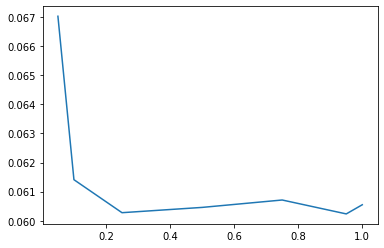

In [ ]:
#plt.plot([50,100,500],[scores1[0],scores2[0],scores3[0]])

plt.plot([0.05,0.1,0.25,0.5,0.75,0.95,1],[scores1[0],scores2[0],scores3[0],scores4[0],scores5[0],scores6[0],scores7[0]])

In [ ]:
# Training of a Sequential Network with PyTorch

import torch
import torch
from torch.autograd import Variable
import torch.nn.functional as F
import torch.utils.data as Data

# Seed for replicability of results
torch.manual_seed(1)


features_train = torch.Tensor(features_scaled[train_indices,])
response_train = torch.Tensor(response.values[train_indices,])

x_train, y_train = Variable(features_train), Variable(response_train)

input_dim = features_train.shape[1]

# Definition of the network structure
net = torch.nn.Sequential(
        torch.nn.Linear(input_dim, 200),
        torch.nn.LeakyReLU(),
        torch.nn.Linear(200, 100),
        torch.nn.LeakyReLU(),
        torch.nn.Linear(100, 1),
)

optimizer = torch.optim.Adam(net.parameters(), lr=0.01)
loss_func = torch.nn.MSELoss()  # this is for regression mean squared loss

BATCH_SIZE = 64 # Number of observations per batch
EPOCH = 50 # Number of iterations

# Load data through a tensor per batch
torch_dataset = Data.TensorDataset(features_train, response_train)

loader = Data.DataLoader(
    dataset=torch_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True, num_workers=2)

# Train the network by batch
net_fit = []
losses = []
for epoch in range(EPOCH):
    print(epoch)
    for step, (batch_x, batch_y) in enumerate(loader): # for each training step

        b_x = Variable(batch_x)
        b_y = Variable(batch_y)

        prediction = net(b_x)     # input x and predict based on x

        net_fit.append(prediction)

        loss = loss_func(prediction, b_y)     # must be (1. nn output, 2. target)

        optimizer.zero_grad()   # clear gradients for next train
        loss.backward()         # backpropagation, compute gradients
        optimizer.step()        # apply gradients
        losses.append(loss.detach().numpy())

# Plot evolution of loss per epoch
loss_df = pd.DataFrame({'epoch': range(len(losses)), 'loss': losses})
loss_df_epoch = loss_df.loc[(loss_df.epoch.values % BATCH_SIZE) == 0,:]
px.line(loss_df_epoch, x='epoch', y='loss').show()








0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


In [ ]:
# Prediction of Neural network on testing set

features_test = torch.Tensor(features_scaled[test_indices,])
response_test = torch.Tensor(response.values[test_indices,])
timestamp_test = data_site.index[test_indices]

# Tensor for testing loaded with BATCH size
torch_dataset_test = Data.TensorDataset(features_test, response_test)
loader = Data.DataLoader(
    dataset=torch_dataset_test,
    batch_size=BATCH_SIZE,
    shuffle=False, num_workers=2)

# Loop to retrieve prediction from the network by batch
net_predict = []
for step, (batch_x, batch_y) in enumerate(loader): # for each training step

        b_x = Variable(batch_x)
        b_y = Variable(batch_y)
        prediction = net(b_x)     # input x and predict based on x

        net_predict.append(pd.DataFrame({'prediction': prediction.detach().numpy().ravel(),
                                         'observation': batch_y.detach().numpy().ravel(),
                                         'timestamp': timestamp_test[(step * BATCH_SIZE): ((step+1) * BATCH_SIZE )]}))

pred_df_densenet = pd.concat(net_predict)

print(pred_df_densenet)

px.line(pred_df_densenet.melt(id_vars='timestamp'), x='timestamp', y='value', color='variable').show()






In [ ]:
# Votre code ici

# 2. Optimisation des décisions de marché

Cette section propose quelques applications de prise de décision dans les marchés à court terme de l'électricité.


## **2.1. Quantile optimal de production renouvelable**

**Exercice (20 min)**


1.   Sur la base d'une des prévisions probabilistes avec GBRT que vous aurez sélectionnée, trouver le quantile optimal de la distribution prévue à offrir sur le marché en fonction des prix de pénalité dus aux écarts. Ce quantile $\tau_{t+k}$ se calcule à partir de:
* $\pi^+_{t+k}= \pi_{t+k}  - \pi^{pos,imb}_{t+k}$, coût net des écarts positifs par rapport au prix day-ahead
* $\pi^-_{t+k}= \pi^{neg,imb}_{t+k} - \pi_{t+k}$, coût net des écarts negatifs par rapport au prix day-ahead

Le quantile le plus proche de $\tau_{t+k} = \frac{\pi^+_{t+k}}{\pi^+_{t+k}+\pi^-_{t+k}}$ est retenu comme étant le volume à vendre à chaque instant $z_{t+k}$.

2. Etablissez l'expression du profit en fonction des ventes day-ahead au prix $\pi_{t+k}$ et des pénalités en temps réel une fois la production réalisée $y_{t+k}$ (colonne `POWER` de votre dataframe de prévision).
3. Comparer le profit obtenu par cette méthode avec le profit obtenu si $z_{t+k}$ est égal à (1) la moyenne des quantiles, et (2) si $z_{t+k}$ est égal $y_{t+k-24h}$ (persistance journalière).







In [ ]:
# Import des données de prix
price_data = pd.read_csv('https://raw.githubusercontent.com/simoncamal/tutorial-forecasting-trading/main/tutorial_data/energy_prices.csv', parse_dates=True, index_col=0).drop(['positive imbalance price', 'negative imbalance price'], axis=1)
# Simulation des prix des écarts positifs et négatifs
price_data['positive imbalance price'] = price_data['day-ahead price'] - np.random.gamma(2, 2, price_data.shape[0])
price_data['negative imbalance price'] = price_data['day-ahead price'] + np.random.gamma(3, 2, price_data.shape[0])

print(price_data)
price_data['optimal_quantile_value'] =  (price_data['day-ahead price'] -
  price_data['positive imbalance price'])/(price_data['negative imbalance price'] - price_data['positive imbalance price'])
# approximate quantile value
price_data['optimal_quantile_digits'] = np.round(price_data['optimal_quantile_value'], decimals=1)
#px.line(price_data.reset_index(), x='timestamp', y='optimal_quantile_value').show()
#px.histogram(price_data, x='optimal_quantile_value').show()

# Votre code ici

# Compute profit

# Votre code ici

# Compare to benchmarks, average of quantiles and persistence

# Votre code ici



---


## 2.2 **Contrôle prédictif d'une batterie réalisant un arbitrage sur le marché de l'électricité**

Optimiser le planning de charge / décharge d'une batterie qui charge $p^c_t$ et décharge $p^d_t$ en fonction des prix du marché de l'électricité $π_t$


---



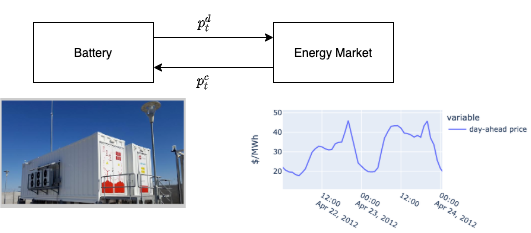


**Formulation du problème**

$max_{E,p^d, p^c} \sum_{i \in [1,N]} \pi_i (p^d_i - p^c_i)$

$s.t.$

$E_i = E_{i-1} + \Delta t (p^c_i η^c - p^d_i / \eta^d) \quad \forall i \in [1,N]$

$E_0 = E_N$

$0 \leq p^c_i \leq p^c_{max}, \quad \forall i \in [1,N]$

$0 \leq p^d_i \leq p^d_{max}, \quad \forall i \in [1,N]$

$0 \leq E_i \leq E_{max}, \quad \forall i \in [1,N]$

Variables du problème:

* $p^d_i, \forall i \in [1,N]$ décharge de la batterie en MW
* $p^c_i, \forall i \in [1,N]$ charge de la batterie en MW
* $E_i, \forall i \in [1,N]$  énergie contenue dans la batterie, MWh

Paramètres du problème:

* $\pi_i, \forall i \in [1,N] $ prix marché day-ahead électricité $[\$\MWh]$
* $\Delta t$ intervalle de temps sur le marché, ici 1 h
* Capacité de la batterie $E_{max}=$ 4 MWh , $p^c_{max}, p^d_{max}=$ 1 MW
* Rendement de charge / décharge $\eta^c, \eta^d$ = 0.9

Hypothèses du problème:

*   Pas d'incertitude sur les prix
*   Horizon de l'optimisation $N$: 24 heures


**Définition** d'un modèle d'optimisation Pyomo réalisant l'optimisation du contrôle predictif.  

In [ ]:
# Fonction de création du modèle d'optimisation d'arbitrage
def build_optim_arbitrage(price, e0):
    '''
    Create optimization model for MPC

    Arguments (inputs):
        price: NumPy array with energy price timeseries
        e0: initial value for energy storage level

    Returns (outputs):
        my_model: Pyomo optimization model
    '''

    # Create a concrete Pyomo model.
    my_model = pyo.ConcreteModel()

    ## Define Sets

    print(len(price))

    # Number of timesteps in planning horizon
    my_model.HORIZON = pyo.Set(initialize = range(len(price)))

    ## Define Parameters

    # Charging/discharding efficiency of battery
    my_model.eta_charge = pyo.Param(initialize = 0.9)
    my_model.eta_discharge = pyo.Param(initialize = 0.9)

    # Energy in battery at t=0
    my_model.E0 = pyo.Param(initialize = e0, mutable=True) # Mutable parameter enables easy modification of the parameter

    ## Define variables

    # Charging rate [MW]
    my_model.c = pyo.Var(my_model.HORIZON, initialize = 0.0, bounds=(0, 1))

    # Discharging rate [MW]
    my_model.d = pyo.Var(my_model.HORIZON, initialize = 0.0, bounds=(0, 1))

    # Energy (state-of-charge) [MWh]
    my_model.E = pyo.Var(my_model.HORIZON, initialize = 0.0, bounds=(0, 4))

    ## Define constraints

    # Define Energy Balance constraints. [MWh] = [MW]*[1 hr]
    # Note: this model assumes 1-hour timestep in price data and control actions.
    def EnergyBalance(model,t):
        # First timestep
        if t == 0 :
            return model.E[t] == model.E0 + model.c[t] / model.eta_charge - model.d[t] * model.eta_discharge

        # Subsequent timesteps
        else :
            return model.E[t] == model.E[t-1] + model.c[t] / model.eta_charge - model.d[t] * model.eta_discharge

    my_model.EnergyBalance_Con = pyo.Constraint(my_model.HORIZON, rule = EnergyBalance)

    # Enforce the amount of energy is the storage at the final time must equal
    # the initial time.
    # [MWh] = [MWh]
    my_model.PeriodicBoundaryCondition = pyo.Constraint(expr=my_model.E0 == my_model.E[len(price)-1])


    my_model.price = pyo.Param(my_model.HORIZON, initialize = price, domain=pyo.Reals, mutable=True)

    my_model.pprint()

    ## Define the objective function (profit)
    # Receding horizon
    def objfun(model):
        return  sum((-model.c[t] + model.d[t]) * my_model.price[t] for t in model.HORIZON)
    my_model.OBJ = pyo.Objective(rule = objfun, sense = pyo.maximize)

    #my_model.OBJ = pyo.Objective(expr = sum((-my_model.c[t] + my_model.d[t]) * my_model.price[t] for t in my_model.HORIZON),
    #    sense = pyo.maximize)

    return my_model

**Formattage** des données de prix sur l'horizon d'optimisation

In [ ]:
def prepare_price_data(price_data, day, num_days):
    ''' Prepare dictionary of price data

    Arugments:
        price_data: pandas DataFrame containing the price variable 'day-ahead price'
        day: int, day to start. day = 0 is the first day
        num_days: numbers of days to include in the vector

    Returns:
        data_dict: dictionary of price data with keys 1 to 24


    '''

    # Create empty dictionary
    data_dict = {}

    # Extract data as numpy array
    data_np_array = price_data["day-ahead price"][(day)*24:24*(day + num_days)].to_numpy()

    # Loop over elements of numpy array
    for i in range(0,24):

        # Add element to data_dict
        data_dict[i] = data_np_array[i]

    return data_dict

# Create input price data
price_data = pd.read_csv('https://raw.githubusercontent.com/simoncamal/tutorial-forecasting-trading/main/tutorial_data/energy_prices.csv', parse_dates=True)
price_dict = prepare_price_data(price_data=price_data, day=0, num_days=1)
print(price_dict)



**Instantiation** du modèle d'optimisation et **résolution** du problème d'optimisation

In [ ]:
# Instantiate optimization model

arbitrage_model = build_optim_arbitrage(price=price_dict, e0=2)

# Specify the solver
solver = pyo.SolverFactory('glpk', executable='/usr/bin/glpsol')
#solver = pyo.SolverFactory('ipopt', executable='/content/ipopt')

#solver.options['max_iter'] = 50

solver_output = solver.solve(arbitrage_model, tee=False)

# Declare empty lists
c_control = []
d_control = []
E_control = []
t = []

# Loop over elements of HORIZON set.
for i in arbitrage_model.HORIZON:

    t.append(pyo.value(i))

    # Use value( ) function to extract the solution for each varliable and append to the results lists
    c_control.append(pyo.value(arbitrage_model.c[i]))

    # Adding negative sign to discharge for plotting
    d_control.append(-pyo.value(arbitrage_model.d[i]))
    E_control.append(pyo.value(arbitrage_model.E[i]))

results_df = pd.DataFrame({'Charge Power [MW]': c_control,
                           'Discharge Power [MW]': d_control,
                           'Battery energy [MWh]': E_control,
                           'Day-ahead price [$/MWh]': price_dict.values(),
                           'hour': range(24)})

print(results_df)

# Visualisation des résultats de l'optimisation
px.line(results_df[['Battery energy [MWh]', 'Day-ahead price [$/MWh]','hour']].melt(id_vars='hour'),
        x='hour', y='value', color='variable', facet_row='variable', markers=True).update_yaxes(matches=None).show()








---


**Exercice 4 (30 min)**

Apporter dans l'ordre, en fonction du temps disponible, les améliorations suivantes au modèle précédent:

*   ajouter une contrainte afin d'empêcher la charge et décharge simultanée du système de stockage.
Comparer les résultats au modèle précédent.
Conseil: introduisez une ou plusieurs variables binaires.
[API Pyomo](https://pyomo.readthedocs.io/en/stable/working_models.html)
*   le problème ci-dessus est simplement une optimisation multi-périodique. Pour obtenir un contrôle prédictif, il faut appliquer l'optimisation sur une période glissante et retenir la première action de l'horizon
* ajouter à la série de prix un bruit gaussien d'écart type constant 10 $/MWh afin de simuler l'incertitude sur les prix.
* évaluer l'évolution du revenu en fonction de l'horizon





In [ ]:
# Votre code ici



---


## 2.3. **Contrôle prédictif d'un système hybride renouvelable + batterie**

**Exercice 5 (30 min), Homework**

Combinez le problème précédent avec l'Exercice 3 portant sur l'optimisation de vente sur le marché de l'énergie. Il s'agit ici d'optimiser la vente sur le marché de l'énergie en minimisant le coût des pénalités (cf slide 113 du cours).


In [ ]:
# Votre code ici



---


# 5. Matériel annexe

La fonction ci-dessous permet d'effectuer une validation croisée en blocs de séries temporelles afin d'évaluer la robustesse de l'apprentissage à différentes dimensions des sets d'entraînement et de test, tout en conservant la cohérence temporelle (le test est postérieur à l'entraînement).

In [ ]:
# Time series cross validation of an ExtraTree model


def timeseriesCVscore_ExtraTreesRegressor(n_estimators,X,y, timestamps):

    res = []
    pred_df = []
    models = []

    #taus = np.arange(0.1,0.91,0.1)
    my_tscv = TimeSeriesSplit(n_splits=4)

    # The time series CV function takes the training data X and determines the splits
    # so that we can train and test with a set of hyperparameters and evaluate the
    # robustness of these hyperparameters.
    for train_index, test_index in my_tscv.split(X):
        print('starting split...')

        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        timestamps_train = timestamps[train_index]
        timestamps_test = timestamps[test_index]

        # Score using RMSE
        model = ExtraTreesRegressor(n_estimators=n_estimators).fit(X=X_train,y=y_train)
        #test_pred = np.vstack( [model.fit(X_train, y_train).predict(X_test, quantile = 100*q) for q in taus], ).T
        test_pred = model.fit(X_train, y_train).predict(X_test)

        #res.append(CRPS(test_pred, y_test)[1])
        rmse_split = RMSE(test_pred, y_test)
        mae_split = MAE(test_pred, y_test)
        print(mae_split)

        pred_df_split = pd.DataFrame({'prediction': test_pred, 'observation': y_test, 'timestamp': timestamps_test})
        pred_df.append(pred_df_split)
        res.append(rmse_split)
        models.append(model)

    return [res, pred_df, models]

In [ ]:
# ---------------
# Locally linear regression

from math import ceil
import numpy as np
from scipy import linalg

#Defining the bell shaped kernel function - used for plotting later on
def kernel_function(xi,x0,tau= .005):
    return np.exp( - (xi - x0)**2/(2*tau)   )

def lowess_bell_shape_kern(x, y, tau = .005):
    """lowess_bell_shape_kern(x, y, tau = .005) -> yest
    Locally weighted regression: fits a nonparametric regression curve to a scatterplot.
    The arrays x and y contain an equal number of elements; each pair
    (x[i], y[i]) defines a data point in the scatterplot. The function returns
    the estimated (smooth) values of y.
    The kernel function is the bell shaped function with parameter tau. Larger tau will result in a
    smoother curve.
    """
    m = len(x)
    yest = np.zeros(n)

    #Initializing all weights from the bell shape kernel function
    w = np.array([np.exp(- (x - x[i])**2/(2*tau)) for i in range(m)])

    #Looping through all x-points
    for i in range(n):
        weights = w[:, i]
        b = np.array([np.sum(weights * y), np.sum(weights * y * x)])
        A = np.array([[np.sum(weights), np.sum(weights * x)],
                    [np.sum(weights * x), np.sum(weights * x * x)]])
        theta = linalg.solve(A, b)
        yest[i] = theta[0] + theta[1] * x[i]

    return yest